In [309]:
from IPython.display import Image as pdImage
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
from matplotlib import rc
rc('text', usetex=False)
rc('font', **{'family': 'serif', 'serif':['Computer Modern Roman']})
import json, os, shutil, itertools, fnmatch, re
from scipy.interpolate import griddata, make_interp_spline, BSpline
import scipy.misc
import tensorflow as tf
import cirq
import seaborn as sns
import sys
import copy
import pickle as pkl
from create_outputs import CreateOutputs
from PIL import Image, ImageDraw, ImageFont
from collections import defaultdict
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
if sys.platform.startswith('win'):
    code_path = "C:\\Users\\Andrew Patterson\\Google Drive\\PhD\\First Year\\Untitled Folder\\cirq_state_discrimination"
else:
    code_path = "/home/zcapga1/Scratch/state_discrimination/code/"
sys.path.append(code_path)
print(tf.__version__)
print(cirq.__version__)

2.0.0-beta1
0.6.0.dev


In [2]:
def create_args(path: str) -> str:
    args = " --create_outputs --restore_loc=\"{}\" ".format(path)
    
    if re.search(r'tf', path):
        args = args + " --use_tf"
            
    with open(os.path.join(path, 'saved_params.json')) as f:
        params = json.load(f)

#     if params['mu_a'] == 0.5:
#         args = args + ' --file_loc=sigma005_mu05_bconst.json'
#     elif params['mu_a'] == 0.25:
#         args = args + ' --file_loc=sigma005_mu025_bconst.json'
#     else:
    args = args + ' --max_epoch=25 --batch_size=100'
    data_args = ['prop_a', 'b_const', 'a_const', 'mu_a', 'mu_b', 'sigma_a', 'sigma_b']
    for a in data_args:
        args = args + ' --{}={}'.format(a, str(params[a]))
            
    dicts = (params['gate_dict'], params['gate_dict_0'], params['gate_dict_1'])
    dict_path = os.path.join(path, 'temp_dicts.pkl')
    with open(dict_path, 'wb') as f:
        pkl.dump(dicts, f, pkl.HIGHEST_PROTOCOL)
    
    args = args + " --dicts=\"{}\"".format(dict_path)

    other_args = ['cost_error', 'cost_incon', 'no_qubits', 'noise_on', 
                  'noise_prob', 'learning_rate', 'beta1', 'beta2']
    for a in other_args:
        args = args + ' --{}={}'.format(a, str(params[a]))
    return args
            
def generate_output_file(directory: str) -> None:
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for restore_path in folder_list:
        full_path = os.path.join(directory, restore_path)
        if os.path.exists(os.path.join(full_path, 'saved_params.json')):
    
            args = create_args(full_path)

            run_file = os.path.join(code_path, 'run_training.py')
            os.system("python \"" + run_file +"\"" + args)
        

# noise_dir = r"C:\Users\Andrew Patterson\Desktop"
# path = "C:\\Users\\Andrew Patterson\\Documents\\PhD\\cirq_state_discrimination\\checkpoints\\myriad_data\\new_analysis\\tf_noise_array\\2019_08_01_21_50_31"
# if re.search("tf", path):
#     print('yes')
# args = ' --output_loc=\"{}\" '.format(noise_dir) + create_args(r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\new_analysis\tf_noise_array\2019_08_01_21_50_31")
# args

In [3]:
path = r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data"
folders  = os.listdir(path)
folders.remove('tf_min_error')
folders.remove('tf_min_error_mu025')
folders.remove('BAD_RUNS')
folders = [os.path.join(path, f) for f in folders]

C:\Users\Andrew Patterson\Google Drive\PhD\First Year\Untitled Folder\cirq_state_discrimination\create_outputs.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  ax3d = plt.figure().gca(projection='3d')


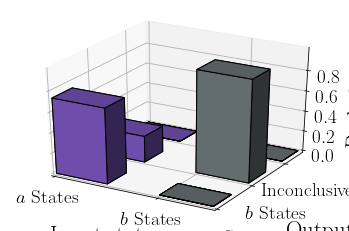

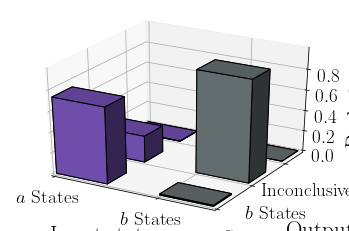

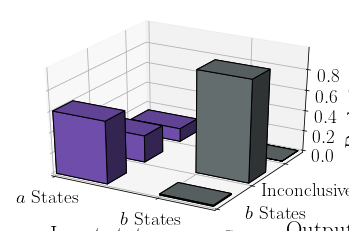

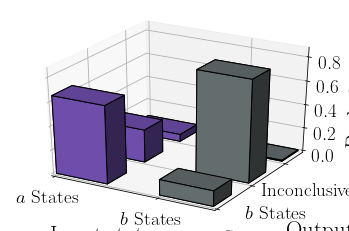

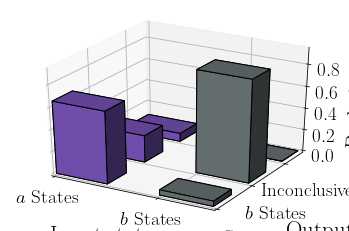

...

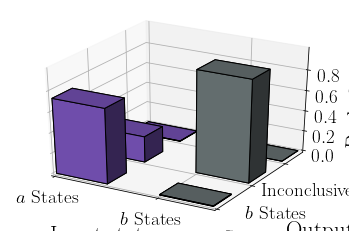

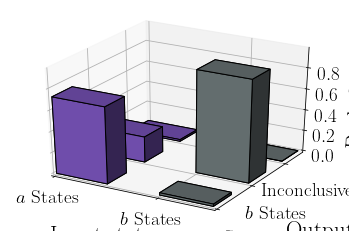

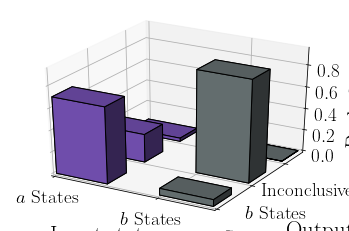

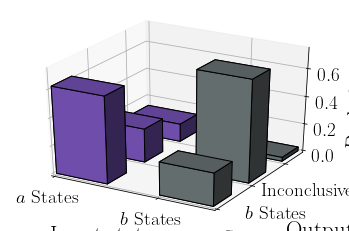

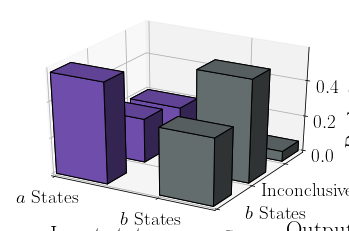

In [8]:
def label_plot(directory: str, create_new=False) -> None:
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for path in folder_list:
        param_path = os.path.join(directory, path, 'saved_params.json')
        plot_path = os.path.join(directory, path, 'outputs')
        if os.path.exists(param_path) and os.path.exists(os.path.join(plot_path, 'probs.npy')):
            if create_new:
                probs = np.load(os.path.join(plot_path, 'probs.npy'))
                CreateOutputs.create_bar_plot(plot_path, probs[0], probs[1])
            
            with open(param_path) as f:
                param_dict = json.load(f)
            
            probs = np.load(os.path.join(plot_path, 'probs.npy'))
            p_suc = np.average([probs[0][0], probs[1][1]])
            msg = u'Success_{:.2f}'.format(p_suc)

            param_list = ['cost_error', 'cost_incon', 'noise_prob', 'mu_a', 'sigma_a']
            if not param_dict['b_const']:
                param_list.extend(['mu_b', 'sigma_b'])

            if param_dict['noise_on'] == 'false' or param_dict['noise_on'] == 'False':
                param_list.remove('noise_prob')
                
            for i, param in enumerate(param_list):
                msg = msg + '_{}_{}'.format(param, param_dict[param])
#                 if (i + 1) % 2 == 0:
#                     msg = msg + "\n"
            msg = msg[:-2]
            msg = msg.replace('.', '-')
#             msg = msg.replace('mu ', '\u03bc')
#             msg = msg.replace('sigma ', '\u03c3')
            

            font_path = os.path.join(r"C:\Users\Andrew Patterson\Documents\PhD\fonts\fonts\ofl\computer-modern", 'cmunrm.ttf')
            font = ImageFont.truetype(font_path, size=13)
            plot = Image.open(os.path.join(plot_path, 'bar_graph.png'))

            width, height = plot.size
            cropped = plot.crop((60, 44, 422, 278))
            draw = ImageDraw.Draw(cropped)
            (x,y) = (5,5)
            colour = 'rgb(0, 0, 0)'
#             draw.text((x,y), msg, fill=colour, font=font)
            save_path = os.path.join(plot_path, 'plot_labeled.png')
            cropped.save(save_path)
            os.system("convert \"{}\" -fuzz 2% -transparent white \"{}\"".format(save_path, save_path))
            try:
                os.rename(os.path.join(directory, path), os.path.join(directory, str(param_dict['noise_prob']).replace('.', '-')))
            except FileExistsError:
                continue
        
direc = r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\august_runs\noise_array'
folders = os.listdir(direc)
# folders = ['tf_noise_array_mu025_new', 'tf_noise_array_new']
for f in folders:
    path = os.path.join(direc, f)
    label_plot(path, True)
# label_plot(r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\august_runs\tf_old_2_60_sigma001_mu025_new', True)

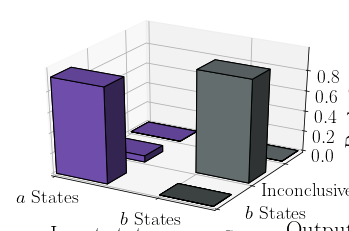

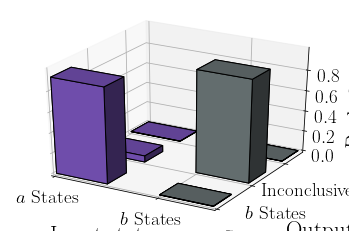

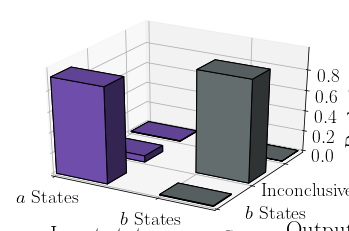

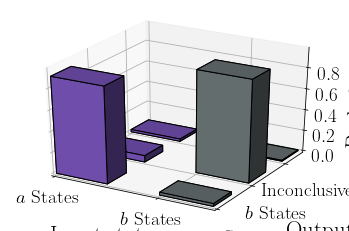

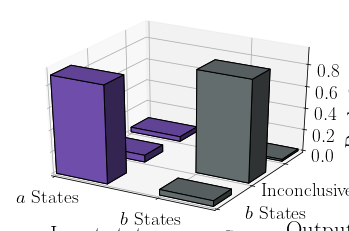

...

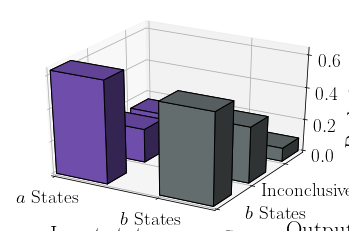

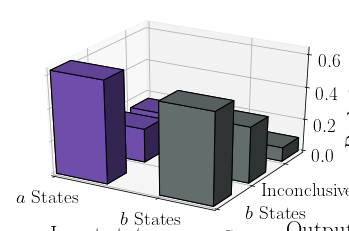

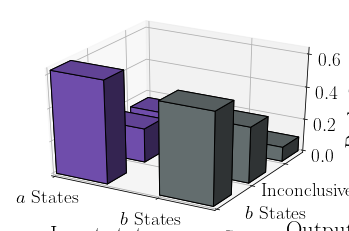

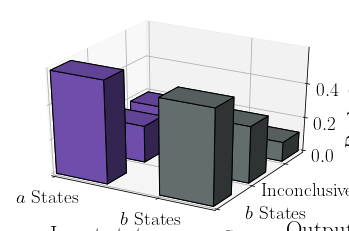

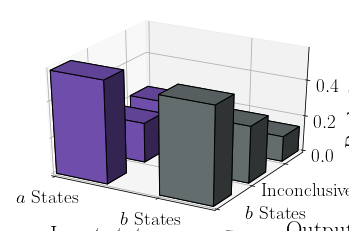

In [9]:
def label_plot_val_levels(directory: str, create_new=False) -> None:
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for path in folder_list:
        param_path = os.path.join(directory, path, 'saved_params.json')
        if os.path.exists(param_path):
            
            with open(param_path) as f:
                param_dict = json.load(f)

            param_list = ['cost_error', 'cost_incon', 'noise_prob', 'mu_a', 'sigma_a']
            if not param_dict['b_const']:
                param_list.extend(['mu_b', 'sigma_b'])
            noise_levels = os.path.join(directory, path, 'outputs_with_noise_levels')
            levels = [f for f in os.listdir(noise_levels) if os.path.isdir(os.path.join(noise_levels, f))]
            for level in levels:
                probs = np.load(os.path.join(noise_levels, level, 'probs.npy'))
                if create_new:
                    CreateOutputs.create_bar_plot(os.path.join(noise_levels, level), probs[0], probs[1])
                
                p_suc = np.average([probs[0][0], probs[1][1]])
                msg = 'Success: {:.2f}, '.format(p_suc)
                for i, param in enumerate(param_list):
                    msg = msg + '{}: {}, '.format(param, param_dict[param])
                    if (i + 1) % 2 == 0:
                        msg = msg + "\n"
                msg = msg.replace('noise_prob', 'training_noise_prob')
                msg = msg + 'validation_noise_prob : {} '.format(level.replace('_', '.'))
                msg = msg.replace('_', ' ')
                msg = msg.replace('mu ', '\u03bc')
                msg = msg.replace('sigma ', '\u03c3')
                

                font_path = r"C:\Users\Andrew Patterson\Documents\PhD\fonts\fonts\ofl\computer-modern\cmunrm.ttf"
                font = ImageFont.truetype(font_path, size=13)
                plot = Image.open(os.path.join(noise_levels, level, 'bar_graph.png'))

                width, height = plot.size
                cropped = plot.crop((60, 44, 422, 278))
                draw = ImageDraw.Draw(cropped)
                (x,y) = (5,5)
                colour = 'rgb(0, 0, 0)'
#                 draw.text((x,y), msg, fill=colour, font=font)
                save_path = os.path.join(noise_levels, level, 'plot_labeled.png')
                cropped.save(save_path)
                os.system("convert \"{}\" -fuzz 1% -transparent white \"{}\"".format(save_path, save_path))

direc = r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\august_runs'
folders = os.listdir(direc)
for f in folders:
    path = os.path.join(direc, f)
    label_plot_val_levels(path, True)

In [7]:
def nwise(iterable, n):
    ts = itertools.tee(iterable, n)
    for c, t in enumerate(ts):
        next(itertools.islice(t, c, c), None)
    return zip(*ts)

def moving_average(iterable, n):
    yield from (sum(x)/n for x in nwise(iterable, n))
    
def plot_loss_fn(folder, n=6, cutoff=100000):
    """
    Input: Takes a list of folders where models are strored and returns a graph of convergences plotted together
    """
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.set_xlabel('Step')
    ax.set_ylabel('Loss')
    ax.set_title('Training loss, Moving average = {}'.format(n))
    files = [f for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
    event_file = fnmatch.filter(files, 'events*')
    steps = []
    loss = []
    for e in tf.compat.v1.train.summary_iterator(os.path.join(folder, event_file[0])):
        for v in e.summary.value:
            if v.tag == 'Training loss':
                if e.step <= cutoff:
                    steps.append(e.step)
                    val = np.frombuffer(v.tensor.tensor_content, dtype=np.float32)[0]
                    loss.append(val)

    param_file = os.path.join(folder, 'saved_params.json')
    with open(param_file, 'r') as f:
        params = json.load(f)
    if params['noise_on'] == "False":
        noise_level = 0
    else:
        noise_level = params['noise_prob']
    tot_cost = float(params['cost_error']) + float(params['cost_incon'])
    loss = np.array(loss)
    loss = loss / tot_cost
    np.save(os.path.join(folder, 'outputs', 'loss_fn.npy'), (steps, loss))
    loss_ma = moving_average(loss, n)
    step_ma = moving_average(steps, n)
    ax.plot(list(step_ma), list(loss_ma), label=noise_level)
    ax.legend()
    plt.savefig(os.path.join(folder, 'outputs', 'loss_fn.png'))

def save_loss_fns(directory: str):
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for path in folder_list:
        if os.path.exists(os.path.join(directory, path, 'saved_params.json')):
            plot_loss_fn(os.path.join(directory, path))
# save_loss_fns(r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_noise_off_g")

In [17]:
def create_data_frame(directory: str):
    df = pd.DataFrame()
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for f in folder_list:
        path = os.path.join(directory, f)
        probs_path = os.path.join(path, 'outputs', 'probs.npy')
        if os.path.isfile(probs_path):
            with open(os.path.join(path, 'saved_params.json')) as js:
                params = json.load(js)
            probs = np.load(probs_path)

            p_error = np.average([probs[0][1], probs[1][0]])
            p_inc = np.average([probs[0][2], probs[1][2]])
            p_suc = np.average([probs[0][0], probs[1][1]])

            loss = p_error + p_inc

            df = df.append({'P_err': p_error, 'P_inc': p_inc, 'P_suc': p_suc, 'cost_err': params['cost_error'],
                            'cost_inc': params['cost_incon'], 'noise_on': params['noise_on'],
                            'noise_prob': params['noise_prob'], 'learning_rate': params['learning_rate'],
                            'loss': loss, 'folder': str(f)},
                           ignore_index=True)


    numeric = ['cost_err', 'cost_inc', 'noise_prob', 'learning_rate']
    df[numeric] = df[numeric].apply(pd.to_numeric, errors='coerce', axis=1)
    if not os.path.exists(os.path.join(directory, 'output')):
        os.mkdir(os.path.join(directory, 'output'))
    df.to_pickle(os.path.join(directory, 'output', 'dataframe.pkl'))
    f, ax = plt.subplots(figsize=(7,7))
    ax.set(xscale='log')
    df.plot(x='noise_prob', y='loss', ax=ax, style='k--')
    ax.set_xlabel('Noise level', fontsize=18)
    ax.set_ylabel('Loss', fontsize=18)
    plt.savefig(os.path.join(directory, 'output', 'loss_noise.png'))
    return df

In [9]:
# df = create_data_frame(r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_noise_array_g")
# f, ax = plt.subplots(figsize=(7,7))
# ax.set(xscale='log', title='Loss with log noise')
# df.plot(x='noise_prob', y='loss', ax=ax, style='k--')

In [9]:
def pre_trained_new_noise_level(restore_directory: str, noise_levels: list):
    noise_levels_path = os.path.join(restore_directory, 'outputs_with_noise_levels')
    if not os.path.exists(noise_levels_path):
        os.mkdir(noise_levels_path)
        
    for noise in noise_levels:
        args_str = create_args(restore_directory)
        args_str = re.sub('(--noise_prob=\d*.\d*)', "--noise_prob={}".format(noise), args_str)
        args_str = re.sub('(--noise_on=\w*|\"\w*\")', "--noise_on=True", args_str)
        
        noise_dir = os.path.join(noise_levels_path, re.sub('\.', '_', str(noise)))
        args_str = args_str + ' --output_loc=\"{}\"'.format(noise_dir)
        run_file = os.path.join(code_path, 'run_training.py')
        os.system("python \"" + run_file +"\"" + args_str)
        
def pre_trained_multiple(directory: str, noise_levels: list):
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for path in folder_list:
        # if (not os.path.exists(os.path.join(directory, path, 'outputs_with_noise_levels'))) and os.path.exists(os.path.join(directory, path, 'saved_params.json')):
        if os.path.exists(os.path.join(directory, path, 'saved_params.json')):
            pre_trained_new_noise_level(os.path.join(directory, path), use_tf, noise_levels)

noise_levels = [0.0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.25]        
# pre_trained_multiple(r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_noise_off_g", True, noise_levels)
# pre_trained_multiple(r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_noise_array", noise_levels)

In [12]:
deep=["#4C72B0", "#55A868", "#C44E52",
      "#8172B2", "#CCB974", "#64B5CD"]
muted=["#4878CF", "#6ACC65", "#D65F5F",
       "#B47CC7", "#C4AD66", "#77BEDB"]
pastel=["#92C6FF", "#97F0AA", "#FF9F9A",
        "#D0BBFF", "#FFFEA3", "#B0E0E6"]
bright=["#003FFF", "#03ED3A", "#E8000B",
        "#8A2BE2", "#FFC400", "#00D7FF"]
dark=["#001C7F", "#017517", "#8C0900",
      "#7600A1", "#B8860B", "#006374"]
colorblind=["#0072B2", "#009E73", "#D55E00",
            "#CC79A7", "#F0E442", "#56B4E9"]
pal = dark
noise_pal = {0.0: pal[0], 0.0001: pal[1], 0.0005: pal[2], 0.001: pal[3], 0.005: pal[4],  0.01: pal[5], 0.05: pal[0], 0.1: pal[1], 0.25:pal[2]}

def create_noise_levels_df(directory: str) -> pd.DataFrame:
    df = pd.DataFrame()
    params_path = os.path.join(directory, 'saved_params.json')
    with open(params_path) as js:
        params = json.load(js)
    noise_folder = os.path.join(directory, 'outputs_with_noise_levels')
    noise_paths = [f for f in os.listdir(noise_folder) if os.path.isdir(os.path.join(noise_folder, f))]
    for p in noise_paths:
        path = os.path.join(noise_folder, p)
        probs = np.load(os.path.join(path, 'probs.npy'))
        
        p_error = np.average([probs[0][1], probs[1][0]])
        p_inc = np.average([probs[0][2], probs[1][2]])
        p_suc = np.average([probs[0][0], probs[1][1]])

        loss = p_error + p_inc
        
        if params['noise_on'] == 'True':
            training_noise = params['noise_prob']
        else:
            training_noise = 0

        df = df.append({'P_err': p_error, 'P_inc': p_inc, 'cost_err': params['cost_error'],
                        'cost_inc': params['cost_incon'], 'mu_a': params['mu_a'], 'training_noise': training_noise, 
                        'noise_prob': re.sub('\_', '.', p), 'loss': loss},
                       ignore_index=True)
    return df
        
def log_on_one_plot(directory: str):
    df = pd.DataFrame()
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for f in folder_list:
        if os.path.exists(os.path.join(directory, f, 'saved_params.json')):
            df = df.append(create_noise_levels_df(os.path.join(directory, f)))
    f, ax = plt.subplots(figsize=(7,7))
    #ax.set(xscale='log', title='Loss with log noise')
    
    numeric = ['cost_err', 'cost_inc', 'noise_prob', 'loss']
    df[numeric] = df[numeric].apply(pd.to_numeric, errors='coerce', axis=1)
    for x in [0.0005, 0.005, 0.25]:
        df = df[df.training_noise != x]
    df['training_noise_cat'] = df['training_noise'].astype('category')
    sns.scatterplot(x='noise_prob', y='loss', style='training_noise_cat', data=df, hue='training_noise_cat', palette=noise_pal, s=100, alpha=0.5)
#     for key, group in df.groupby('training_noise'):
#         sns.scatterplot(group['noise_prob'], group['loss'], legend='full')
    if not os.path.exists(os.path.join(directory, 'output')):
        os.mkdir(os.path.join(directory, 'output'))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set(xscale='log')
#     ax.set_title('Loss against noise level in validation circuit \nfor different levels of training noise.', fontsize=23)
    ax.set_xlabel('Validation noise level', fontsize=18)
    ax.set_ylabel('Loss', fontsize=18)
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:], title="Training noise level", title_fontsize=16, fontsize=14)
    ax.set(xlim=(0.00045, 0.12))#, ylim=(0.12,0.18))
    
    
    plt.savefig(os.path.join(directory, 'output', 'log_noise_plot.png'))
    df.to_pickle(os.path.join(directory, 'output', 'noise_df.pkl'))

#log_on_one_plot(r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\august_runs\tf_noise_array_mu075')

c:\users\andrew patterson\documents\phd\envs\ml_compiler\env\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
c:\users\andrew patterson\documents\phd\envs\ml_compiler\env\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
c:\users\andrew patterson\documents\phd\envs\ml_compiler\env\lib\site-packages\ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained un

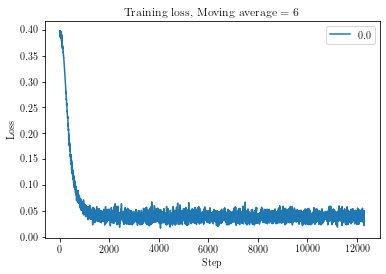

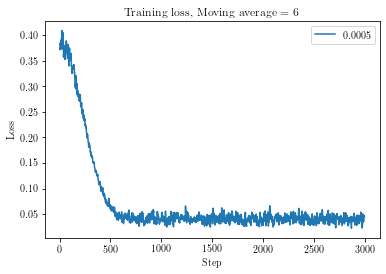

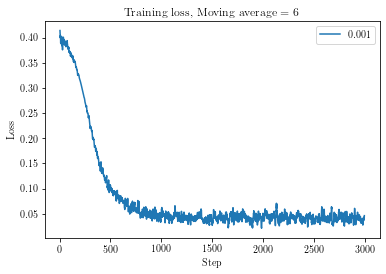

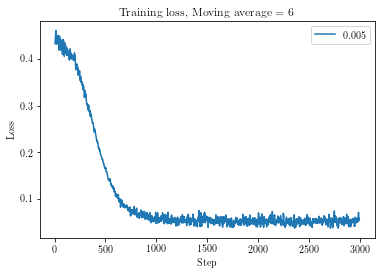

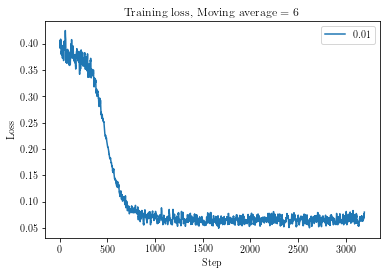

...

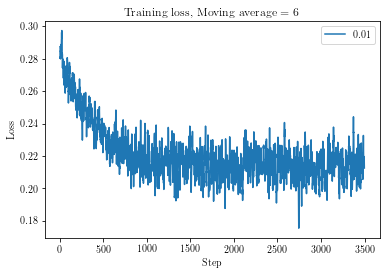

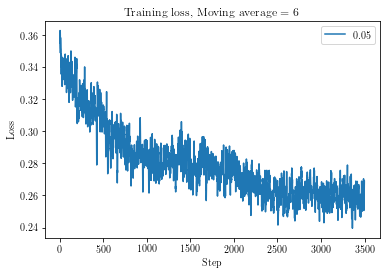

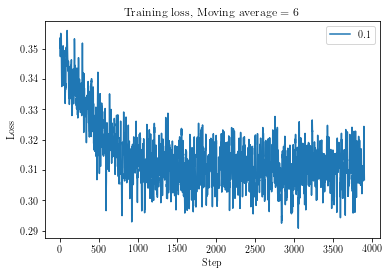

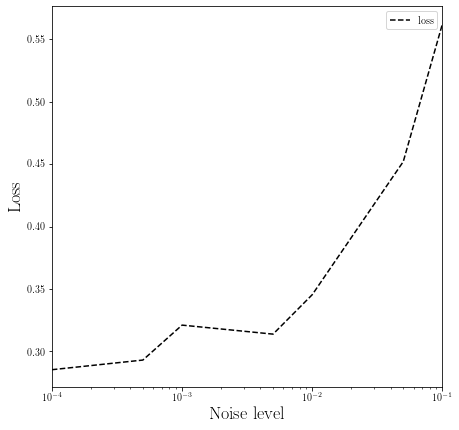

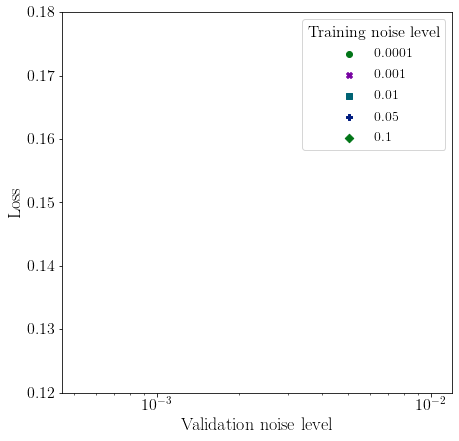

In [23]:
if sys.platform.startswith('win'):
    checkpoints = "C:\\Users\\Andrew Patterson\\Documents\\PhD\\cirq_state_discrimination\\checkpoints\\myriad_data\\august_runs"
else:
    checkpoints = "/home/zcapga1/Scratch/state_discrimination/training_out/"

# runs = ['tf_noise_off', 'tf_old_dicts_noise_off', 'cirq_training_noise_off', 'tf_noise_array', 'tf_old_dicts_noise_array', 'tf_old_dicts_noise_off']
runs = ['tf_25_2_mu05', 'tf_25_2_mu25', 'tf_noise_array_mu09', 'tf_noise_array_mu075', 'tf_old_new_2']
# rm = ['BAD_RUNS', 'cirq_training_noise_off', 'cirq_training_noise_on_array', 'cirq_training_noise_off_long', 'cirq_training_noise_on_array_long']
# for r in rm:
#     runs.remove(r)
folder_list = [os.path.join(checkpoints, f) for f in runs]

noise_levels = [0.0, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]
def run_on_all_folders(folders: list, noise_levels: list):
    for folder in folders:
#         generate_output_file(folder)
#         label_plot(folder)
        save_loss_fns(folder)
        create_data_frame(folder)
#         pre_trained_multiple(folder, noise_levels)
        label_plot_val_levels(folder)
        log_on_one_plot(folder)
        
run_on_all_folders(folder_list, noise_levels)

In [89]:
def check_probs(directory: str):
    flagged_folders = []
    okay = []
    folder_list = [f for f in os.listdir(directory) if os.path.isdir(os.path.join(directory, f))]
    for folder in folder_list:
        full_path = os.path.join(directory, folder)
        if os.path.exists(os.path.join(full_path, 'saved_params.json')):
            with open(os.path.join(full_path, 'saved_params.json'), 'r') as f:
                params = json.load(f)
            tr_noise = params['noise_prob']
            probs = np.load(os.path.join(full_path, 'outputs', 'probs.npy'))
            if (np.isclose(np.sum(probs[0]), 0, atol=0.0001, rtol=0.1)) or (np.isclose(np.sum(probs[1]), 0, atol=0.0001, rtol=0.1)):
                flagged_folders.append(directory[90:] + ' tr:{}'.format(tr_noise))
                
            noise_outputs = os.path.join(full_path, 'outputs_with_noise_levels')
            noise_levels = [f for f in os.listdir(noise_outputs) if os.path.isdir(os.path.join(noise_outputs, f))]
            for noise in noise_levels:
                noise_path = os.path.join(noise_outputs, noise)
                probs = np.load(os.path.join(noise_path, 'probs.npy'))
                if (np.isclose(np.sum(probs[0]), 0, atol=0.0001, rtol=0.1)) or (np.isclose(np.sum(probs[1]), 0, atol=0.0001, rtol=0.1)):
                    flagged_folders.append(directory[90:] + ' tr:{}, vl:{}'.format(tr_noise, noise.replace('_', '.')))
                    
                    
                    
    return flagged_folders, okay

flagged_out = []
okay_out = []
direc = r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\new_script\tf_noise_array"


script_d = r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\new_script"
direc_list = [os.path.join(script_d, f) for f in os.listdir(script_d)]
# for d in direc_list:
#     folder_list = [os.path.join(d, f) for f in os.listdir(d) if os.path.isdir(os.path.join(d, f))]
#     for f in folder_list:
#         flagged, okay = check_probs(f)
#         flagged_out.append(flagged)
#         okay_out.append(okay)
# print(flagged_out)

[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


In [76]:
def return_probs(folder):
    probs = []
    main = np.load(os.path.join(folder, 'outputs', 'probs.npy'))
    probs.append((1.0, main[0], main[1]))
    levels_path = os.path.join(folder, 'outputs_with_noise_levels')
    levels = [f for f in os.listdir(levels_path) if os.path.isdir(os.path.join(levels_path, f))]
    for noise in levels:
        noise_probs = np.load(os.path.join(levels_path, noise, 'probs.npy'))
        probs.append((float(noise.replace('_', '.')), noise_probs[0], noise_probs[1]))
    return probs

def compare_analyses(folders: list):
    compare = []
    for f in folders:
        probs_f = return_probs(f)
        compare.append(probs_f)
    compare = np.array(compare)
    for i, probs in enumerate(compare[0]):
        print(np.isclose(compare[0][i][1], compare[1][i][1]))
        print(np.isclose(compare[0][i][2], compare[1][i][2]))

# compare_analyses([r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\short_analysis\tf_noise_off\2019_07_30_18_36_29", 
#                   r"C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\new_analysis\tf_noise_off\2019_07_30_18_36_29"])

[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]
[ True  True  True]


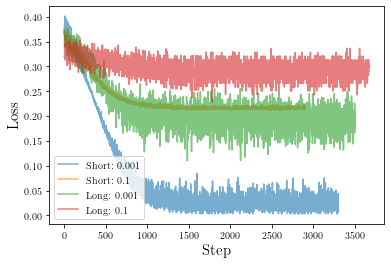

In [77]:
loss_folders = [r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_noise_array\2019_08_02_01_06_50', 
               r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_noise_array\2019_08_02_03_25_31', 
               r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_old_new\2019_08_24_17_53_30', 
               r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\tf_old_new\2019_08_24_19_09_30']

def plot_loss_fns(output_locs: list):
    df = pd.DataFrame()
    for folder in output_locs:
        with open(os.path.join(folder, 'saved_params.json'), 'rb') as f:
            params = json.load(f)
        if 'old' in folder:
            length = 'Long'
        else:
            length = 'Short'
        loss_fn = np.load(os.path.join(folder, 'outputs', 'loss_fn.npy'))
        noise = params['noise_prob']
        df = df.append({'noise': noise, 'step': loss_fn[0], 'loss': loss_fn[1], 'lab': length}, ignore_index=True)
    df['noise'] = df['noise'].astype('category')
    for i, row in df.iterrows():
        # sns.scatterplot(x='step', y='loss', style='noise', data=df, hue='noise', palette=noise_pal)
        plt.plot(row['step'], row['loss'], label='{}: {}'.format(row['lab'], row['noise']), alpha=0.6)
    plt.xlabel('Step')
    plt.ylabel('Loss')
    plt.title('Loss functions for example runs\nof the algorithm')
    plt.legend()
    df.to_pickle(r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\loss_fn_df.pkl')
    plt.show()

df = pd.read_pickle(r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\loss_fn_df.pkl')
for i, row in df.iterrows():
        plt.plot(row['step'], row['loss'], label='{}: {}'.format(row['lab'], row['noise']), alpha=0.6)
plt.xlabel('Step', fontsize=15)
plt.ylabel('Loss', fontsize=15)
# plt.title('Loss functions for example runs\nof the algorithm')
plt.legend()

plt.show()

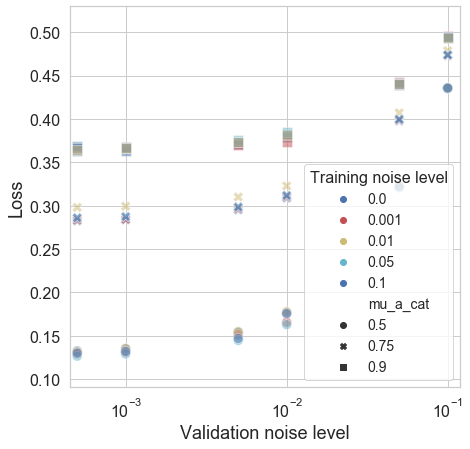

In [304]:
deep=["#4C72B0", "#55A868", "#C44E52",
      "#8172B2", "#CCB974", "#64B5CD"]
muted=["#4878CF", "#6ACC65", "#D65F5F",
       "#B47CC7", "#C4AD66", "#77BEDB"]
pastel=["#92C6FF", "#97F0AA", "#FF9F9A",
        "#D0BBFF", "#FFFEA3", "#B0E0E6"]
bright=["#003FFF", "#03ED3A", "#E8000B",
        "#8A2BE2", "#FFC400", "#00D7FF"]
dark=["#001C7F", "#017517", "#8C0900",
      "#7600A1", "#B8860B", "#006374"]
colorblind=["#0072B2", "#009E73", "#D55E00",
            "#CC79A7", "#F0E442", "#56B4E9"]
pal = deep
noise_pal = {0.0: pal[0], 0.0005: pal[1], 0.001: pal[2], 0.005: pal[3],  0.01: pal[4], 0.05: pal[5], 0.1: pal[0], 0.25:pal[1]}


def compare_val_tr_noise_mu(directory: str, folders: list):
    df  = pd.DataFrame()
    folder_list = [os.path.join(directory, f) for f in folders]
    for run in folder_list:
        for f in [os.path.join(run, a) for a in os.listdir(run)]:
            if os.path.exists(os.path.join(f, 'saved_params.json')):
                df = df.append(create_noise_levels_df(f))
    f, ax = plt.subplots(figsize=(7,7))

    numeric = ['cost_err', 'cost_inc', 'noise_prob', 'loss', 'mu_a']
    df[numeric] = df[numeric].apply(pd.to_numeric, errors='coerce', axis=1)
    for x in [0.0005, 0.005, 0.25, 0.0001]:
        df = df[df.training_noise != x]
    df['training_noise_cat'] = df['training_noise'].astype('category')
    df['mu_a_cat'] = df['mu_a'].astype('category')
    df['training_noise_log'] = df['training_noise']*1000
            
    sns.scatterplot(x='noise_prob', y='loss', style='mu_a_cat', data=df, hue='training_noise', palette=noise_pal, s=100, alpha=0.5)

    if not os.path.exists(os.path.join(directory, 'output')):
        os.mkdir(os.path.join(directory, 'output'))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set(xscale='log')
#     ax.set_title('Loss against noise level in validation circuit \nfor different levels of training noise.', fontsize=23)
    ax.set_xlabel('Validation noise level', fontsize=18)
    ax.set_ylabel('Loss', fontsize=18)
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:], title="Training noise level", title_fontsize=16, fontsize=14)
    ax.set(xlim=(0.00045, 0.12))#, ylim=(0.12,0.18))


    plt.savefig(os.path.join(directory, 'output', 'noise_mu_plot.png'))
    df.to_pickle(os.path.join(directory, 'output', 'noise_mu_df.pkl'))
        

comparisons = ['tf_noise_array_mu09', 'tf_noise_array_mu075', 'tf_noise_array_new', ]
direc = r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\august_runs'
compare_val_tr_noise_mu(direc, comparisons)

In [362]:
direc = r'C:\Users\Andrew Patterson\Documents\PhD\cirq_state_discrimination\checkpoints\myriad_data\august_runs\noise_array'
folders = [f for f in os.listdir(direc) if os.path.isdir(os.path.join(direc, f))]
data_lists = []
big_df = pd.DataFrame()
for f in folders:
    run_df = pd.DataFrame()
    fol = os.path.join(direc, f)
    for folder in [os.path.join(fol, a) for a in os.listdir(fol) if os.path.isdir(os.path.join(fol, a))]:
        df = create_noise_levels_df(folder)
        numeric = ['cost_err', 'cost_inc', 'noise_prob', 'loss', 'mu_a']
        df[numeric] = df[numeric].apply(pd.to_numeric, errors='coerce', axis=1)
        df['training_noise_cat'] = df['training_noise'].astype('category')
        for x in [0.0005, 0.005, 0.25, 0.0001]:
            df = df[df.training_noise != x]
        run_df = run_df.append(df)
    big_df = big_df.append(run_df, ignore_index=True)
    data_lists.append(run_df)

In [254]:
concat = pd.concat(data_lists, axis=0).groupby(['training_noise', 'noise_prob', 'training_noise_cat'], as_index=False)
mean_df = concat.mean()
stderr = concat['loss'].std().div(np.sqrt(len(data_lists))).mul(2.0)
mean_df = mean_df.join(stderr['loss'].rename('loss_err'))
mean_df

,training_noise,noise_prob,training_noise_cat,P_err,P_inc,cost_err,cost_inc,loss,mu_a,loss_err
0,0.000,0.0000,0.000,0.129557,5.742866e-07,40.0,40.0,0.129558,0.5,0.000965
1,0.000,0.0005,0.000,0.130918,8.804884e-04,40.0,40.0,0.131799,0.5,0.000971
2,0.000,0.0010,0.000,0.132133,1.756895e-03,40.0,40.0,0.133890,0.5,0.001082
3,0.000,0.0050,0.000,0.143019,8.720902e-03,40.0,40.0,0.151740,0.5,0.001608
4,0.000,0.0100,0.000,0.157017,1.728512e-02,40.0,40.0,0.174302,0.5,0.002307
5,0.000,0.0500,0.000,0.242564,7.851573e-02,40.0,40.0,0.321080,0.5,0.000478
6,0.000,0.1000,0.000,0.301843,1.334680e-01,40.0,40.0,0.435311,0.5,0.000282
7,0.001,0.0000,0.001,0.168880,1.510530e-02,40.0,40.0,0.183986,0.5,0.044468
8,0.001,0.0005,0.001,0.168338,1.548984e-02,40.0,40.0,0.183828,0.5,0.044522
9,0.001,0.0010,0.001,0.171174,1.672827e-02,40.0,40.0,0.187902,0.5,0.044196


<ErrorbarContainer object of 3 artists>

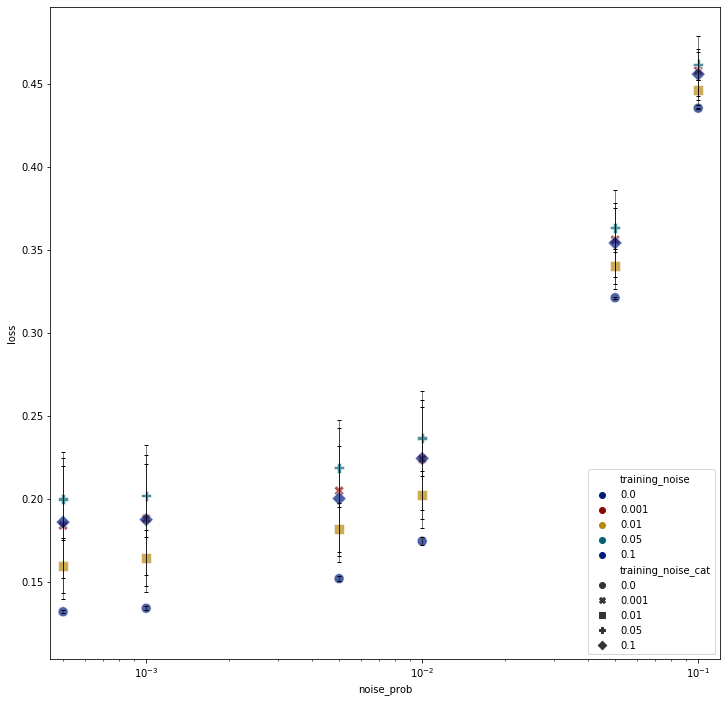

In [264]:
f, ax = plt.subplots(figsize=(12, 12))
ax.set(xscale='log', xlim=(0.00045, 0.12))
# plt.scatter(mean_df.noise_prob, mean_df.loss, c=mean_df.training_noise)
sns.scatterplot(x='noise_prob', y='loss', data=mean_df, hue='training_noise', palette=noise_pal, s=100, alpha=0.7, style='training_noise_cat')
plt.errorbar(x=mean_df.noise_prob, y=mean_df.loss, yerr=mean_df.loss_err, fmt='none', ecolor='k', elinewidth=.5, capsize=2)

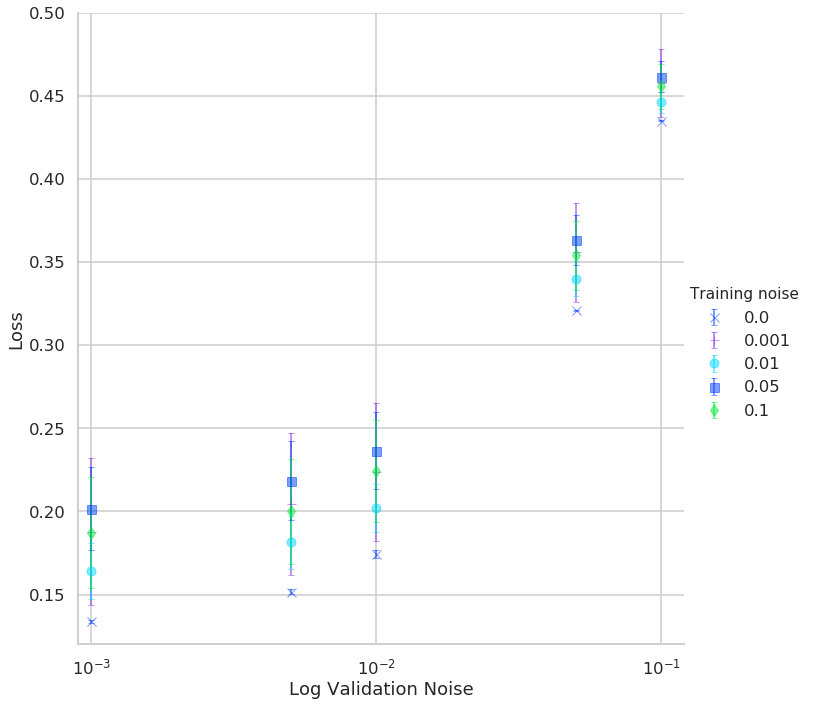

In [328]:
deep=["#4C72B0", "#55A868", "#C44E52",
      "#8172B2", "#CCB974", "#64B5CD"]
muted=["#4878CF", "#6ACC65", "#D65F5F",
       "#B47CC7", "#C4AD66", "#77BEDB"]
pastel=["#92C6FF", "#97F0AA", "#FF9F9A",
        "#D0BBFF", "#FFFEA3", "#B0E0E6"]
bright=["#003FFF", "#03ED3A", "#E8000B",
        "#8A2BE2", "#FFC400", "#00D7FF"]
dark=["#001C7F", "#017517", "#8C0900",
      "#7600A1", "#B8860B", "#006374"]
colorblind=["#0072B2", "#009E73", "#D55E00",
            "#CC79A7", "#F0E442", "#56B4E9"]
pal = bright
noise_pal = {0.0: pal[0], 0.0001: pal[1], 0.0005: pal[2], 0.001: pal[3], 0.005: pal[4],  0.01: pal[5], 0.05: pal[0], 0.1: pal[1], 0.25:pal[2]}

sns.set_style('whitegrid')
sns.set_context('talk')
rc('text', usetex=False)
rc('font', **{'family': 'serif', 'serif':['Computer Modern Roman']})

g = sns.FacetGrid(mean_df, hue='training_noise',palette=noise_pal, hue_kws=dict(marker=['x', '+', 'o', 's', 'd']), height=10)
g = g.map(plt.errorbar, 'noise_prob', 'loss', 'loss_err', fmt='x', elinewidth=2, capsize=3, alpha=.5).set(xlim=(0.0009, 0.12), xscale='log', ylim=(0.12, 0.5), alpha=.5)
g.add_legend(title='Training noise')
g.set_axis_labels(x_var='Log Validation Noise', y_var='Loss')

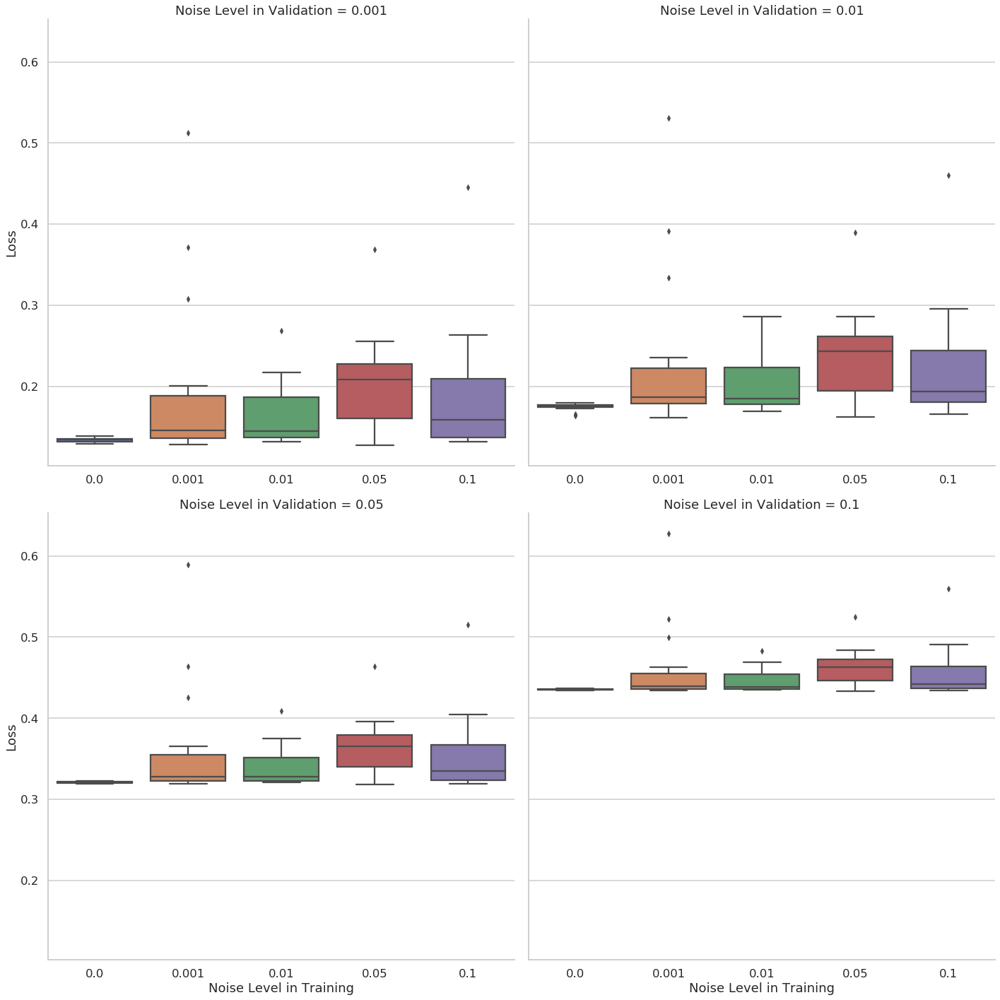

In [383]:
plot_df = copy.copy(big_df)
for x in [0.0, 0.0005, 0.005]:
    plot_df = plot_df[plot_df.noise_prob != x]
g = sns.catplot(x='training_noise', y='loss', data=plot_df, col='noise_prob', col_wrap=2, height=10, kind='box', sharey=True, sharex=False)
g.set_axis_labels(x_var='Noise Level in Training', y_var='Loss')
g.set_titles(col_template="Noise Level in Validation = {col_name}")